----

# Model

In [1]:
using Revise, ReachabilityAnalysis, Plots, SparseArrays
const RA = ReachabilityAnalysis

┌ Info: Precompiling ReachabilityAnalysis [1e97bd63-91d1-579d-8e8d-501d2b57c93f]
└ @ Base loading.jl:1260


ReachabilityAnalysis

## Continuous dynamics

In [2]:
const μ = 3.986e14 * 60^2
const r = 42164.0e3
const r² = r^2
const mc = 500.0
const n² = μ / r^3
const n = sqrt(n²)

const two_n = 2*n
const μ_r² = μ/r²

# columns correspond to x, y, vx, vy, t
const K₁ = [-28.8287 0.1005 -1449.9754 0.0046 0.0;
            -0.087 -33.2562 0.00462 -1451.5013 0.0]
const K₂ = [-288.0288 0.1312 -9614.9898 0.0 0.0;
            -0.1312 -288.0 0.0 -9614.9883   0.0]

const K₁mc = K₁/mc
const K₂mc = K₂/mc

function mymul!(v, A, x)
    @inbounds for ind = 1:length(v)
        v[ind] = zero(x[1])
        for jind = 1:length(x)
            v[ind] += A[ind, jind] * x[jind]
        end
    end
    return nothing
end

# dynamics in the 'approaching' mode
@taylorize function spacecraft_approaching!(du, u, p, t)
    x, y, vx, vy, t = u

    rx = r + x
    rx² = rx^2
    y² = y^2
    rc = sqrt(rx² + y²)
    rc³ = rc^3
    μ_rc³ = μ / rc³

    uxy = Vector{typeof(x)}(undef, 2)
    mymul!(uxy, K₁mc, u)
    
    # x' = vx
    du[1] = vx

    # y' = vy
    du[2] = vy
    
    # vx' = n²x + 2n*vy + μ/(r^2) - μ/(rc^3)*(r+x) + ux/mc
    du[3] = (n²*x + two_n*vy) + ((μ_r² - μ_rc³*rx) + uxy[1])
    
    # vy' = n²y - 2n*vx - μ/(rc^3)y + uy/mc
    du[4] = (n²*y - two_n*vx) - (μ_rc³*y - uxy[2])
    
    # t' = 1
    du[5] = one(x)

    return du
end

# dynamics in the 'rendezvous attempt' mode
@taylorize function spacecraft_attempt!(du, u, p, t)
    x, y, vx, vy, t = u

    rx = r + x
    rx² = rx^2
    y² = y^2
    rc = sqrt(rx² + y²)
    rc³ = rc^3
    μ_rc³ = μ / rc³

    uxy = Vector{typeof(x)}(undef, 2)
    mymul!(uxy, K₂mc, u)
    
    # x' = vx
    du[1] = vx

    # y' = vy
    du[2] = vy
    
    # vx' = n²x + 2n*vy + μ/(r^2) - μ/(rc^3)*(r+x) + ux/mc
    du[3] = (n²*x + two_n*vy) + ((μ_r² - μ_rc³*rx) + uxy[1])
    
    # vy' = n²y - 2n*vx - μ/(rc^3)y + uy/mc
    du[4] = (n²*y - two_n*vx) - (μ_rc³*y - uxy[2])
    
    # t' = 1
    du[5] = one(x)

    return du
end

# dynamics in the 'aborting' mode
@taylorize function spacecraft_aborting!(du, u, p, t)
    x, y, vx, vy, t = u

    rx = r + x
    rx² = rx^2
    y² = y^2
    rc = sqrt(rx² + y²)
    rc³ = rc^3
    μ_rc³ = μ / rc³
    
    # x' = vx
    du[1] = vx

    # y' = vy
    du[2] = vy
    
    # vx' = n²x + 2n*vy + μ/(r^2) - μ/(rc^3)*(r+x)
    du[3] = (n²*x + two_n*vy) + (μ_r² - μ_rc³*rx)
    
    # vy' = n²y - 2n*vx - μ/(rc^3)y
    du[4] = (n²*y - two_n*vx) - μ_rc³*y
    
    # t' = 1
    du[5] = one(x)

    return du
end

## Hybrid dynamics

In [3]:
function spacecraft(; X0 = Hyperrectangle([-900., -400., 0., 0., 0.],
                                             [25., 25., 0., 0., 0.]),
                         init=[(1, X0)],
                         abort_time=(120.0, 150.0))

    # variables
    x = 1   # x position
    y = 2   # y position
    vx = 3  # x velocity
    vy = 4  # y velocity
    t = 5   # time
    n = 4 + 1  # number of variables
    t_abort_lower, t_abort_upper = abort_time[1], abort_time[2]
    
    automaton = LightAutomaton(3)

    # mode 1 "approaching"
    invariant = HalfSpace(sparsevec([x], [1.], n), -100.) # x <= -100
    approaching = @system(x' = spacecraft_approaching!(x), dim:5, x ∈ invariant)

    # mode 2 ("rendezvous attempt")
    invariant = HalfSpace(sparsevec([x], [-1.], n), 100.) # x >= -100
    attempt = @system(x' = spacecraft_attempt!(x), dim:5, x ∈ invariant)

    # mode 3 "aborting"
    invariant = Universe(n)
    aborting = @system(x' = spacecraft_aborting!(x), dim: 5, x ∈ invariant)

    # transition "approach" -> "attempt"
    add_transition!(automaton, 1, 2, 1)
    guard = HalfSpace(sparsevec([x], [-1.], n), 100.) # x >= -100
    t1 = @map(x -> x, dim: n, x ∈ guard)


    # transition "approach" -> "abort"
    add_transition!(automaton, 1, 3, 2)
    guard_time = HPolyhedron([HalfSpace(sparsevec([t], [-1.], n), -t_abort_lower),  # t >= t_abort_lower
                              HalfSpace(sparsevec([t], [1.], n), t_abort_upper)])   # t <= t_abort_upper
    t2 = @map(x -> x, dim: n, x ∈ guard)

    # transition "attempt" -> "abort"
    add_transition!(automaton, 2, 3, 3)
    t3 = @map(x -> x, dim: n, x ∈ guard_time)

    H = HybridSystem(automaton=automaton,
                     modes=[approaching, attempt, aborting],
                     resetmaps=[t1, t2, t3])

    return InitialValueProblem(H, init)
end

spacecraft (generic function with 1 method)

## Specifications

In [4]:
# variables
x, y, vx, vy, t = 1:5
numvars = 5
const tan30 = tand(30)

LineOfSight = HPolyhedron([HalfSpace(sparsevec([x], [-1.], numvars), 100.),   # x >= -100
                    HalfSpace(sparsevec([x, y], [tan30, -1.], numvars), 0.),  # y >= x tan(30°)
                    HalfSpace(sparsevec([x, y], [tan30, 1.], numvars), 0.),   # -y >= x tan(30°)
              ])

Target = Hyperrectangle(zeros(numvars), [0.2, 0.2, 0.0, 0.0, 0.0]);

In [5]:
function absolute_velocity(R::RA.AbstractLazyReachSet)
    vx = 3
    vy = 4
    vx2 = set(overapproximate(project(R, vars=(vx,)), Interval)).dat
    vy2 = set(overapproximate(project(R, vars=(vy,)), Interval)).dat
    sqrt(vx2 + vy2)
end

function absolute_velocity(R::RA.TaylorModelReachSet)
    Z = overapprximate(R, Zonotope)
    absolute_velocity(Z)
end

absolute_velocity (generic function with 2 methods)

# Results

### Flowpipe for the first mode ("approaching")

In [7]:
prob = spacecraft();
H = system(prob);
_, X0 = first(initial_state(prob));

In [13]:
prob_approaching = @ivp(mode(H, 1), x(0) ∈ X0);

In [15]:
@time sol = solve(prob_approaching, tspan=(0.0, 200.0),
                  alg=TMJets(abs_tol=1e-10, orderT=7, orderQ=1, disjointness=RA.BoxEnclosure()));
solz = overapproximate(sol, Zonotope);

  4.460314 seconds (87.14 M allocations: 5.619 GiB, 25.92% gc time)


In [16]:
tspan(sol)

[0, 113.222]

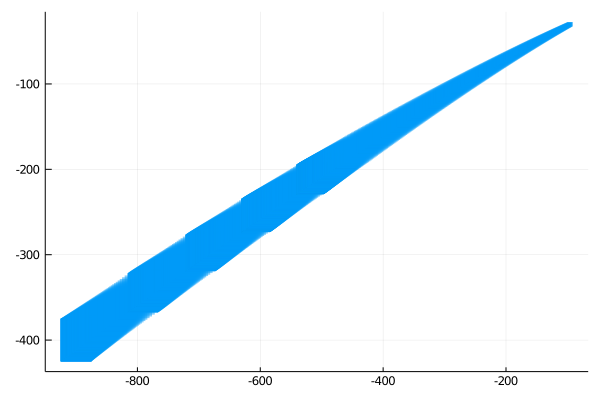

In [18]:
plot(solz, vars=(1, 2), lw=0.0)

In [30]:
# maximum value of x for this flowpipe
ρ(vcat(1.0, zeros(4)), solz)

-91.22065623995348

In [31]:
GC.gc()

### Flowpipe for the hybrid system

In [32]:
prob = spacecraft();

In [34]:
#= Notes:

=#

@time sol = solve(prob,
                  tspan=(0.0, 200.0),
                  alg=TMJets(abs_tol=1e-10, orderT=7, max_steps=10_000, orderQ=1, adaptive=true, disjointness=RA.BoxEnclosure()),
                  max_jumps=10,
                  intersect_source_invariant=false,
                  intersection_method=RA.HRepIntersection(),
                  clustering_method=RA.BoxClustering(),
                  disjointness_method=RA.BoxEnclosure());

solz = overapproximate(sol, Zonotope);

 45.509198 seconds (702.43 M allocations: 45.161 GiB, 24.74% gc time)


In [35]:
tspan(sol)

[0, 200]

In [60]:
# get location for each flowpipe
location.(sol)

4-element Array{Int64,1}:
 1
 3
 2
 3

In [64]:
plot(solz[1], vars=(1, 2), lw=0.0, color=:blue, lab="Approaching")
plot!(solz[3], vars=(1, 2), lw=0.0, color=:red, lab="Attempt", legend=:bottomright)

In [65]:
plot!(solz[2], vars=(1, 2), lw=0.0, color=:green, lab="Aborting")
plot!(solz[4], vars=(1, 2), lw=0.0, color=:green, legend=:bottomright)

## Analysis of the specifications

### (1) Line-of-sight

In mode rendez-vous attempt, the spacecraft has to stay nside the line-of-sight cone.

In [111]:
Hu = HalfSpace([tan30, -1.], 0.0)  # y >= x tan(30°)
Hl = HalfSpace([tan30, 1.], 0.);   # -y >= x tan(30°)
plot(Hu, alpha=.1)
plot!(Hl, alpha=.1, xlims=(-100, 200), ylims=(-100, 100))

plot!(solz[3], vars=(1, 2), alpha=.4, lw=0.0, color=:red, lab="Attempt", legend=:bottomright)

In [66]:
plot(solz[3], vars=(1, 2), lw=0.0, color=:red, lab="Attempt", legend=:bottomright)

The flowpipe is contained in the cone.

In [123]:
all(R ⊆ LineOfSight for R in solz[3][2:end])

true

The first reach-set is not inside the cone because we didn't take the concrete intersection with the invariant (we can do that with the flag `intersect_source_invariant`).

In [125]:
solz[3][1] ⊆ LineOfSight

false

In [126]:
Rxy = project(solz[3][1], vars=(1, 2))

@show Rxy ⊆ Hu
@show Rxy ⊆ Hl
@show -ρ([-1.0, 0.0], Rxy)

Rxy ⊆ Hu = true
Rxy ⊆ Hl = true
-(ρ([-1.0, 0.0], Rxy)) = -100.00061702178948


-100.00061702178948

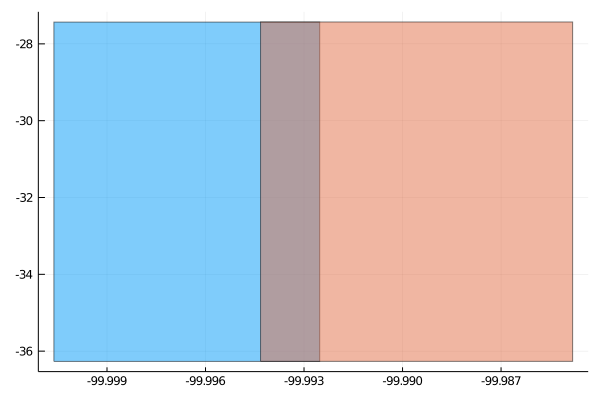

In [93]:
plot(solz[3][1], vars=(1, 2))
plot!(solz[3][2], vars=(1, 2))

### (2) Collision avoidance

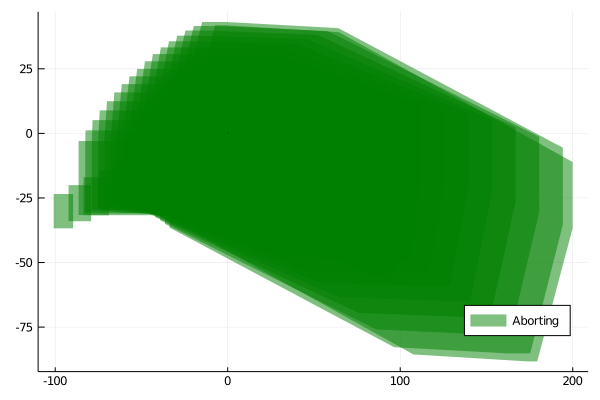

In [86]:
# mode aborting
Target_xy = BallInf(zeros(2), 0.2)
plot(solz[2], vars=(1, 2), lw=0.0, color=:green, lab="Aborting")
plot!(solz[4], vars=(1, 2), lw=0.0, color=:green, legend=:bottomright)
plot!(Target_xy, alpha=.2, color=:black)

In this mode the overapproximation error is very large. This is most probably due to the inaccurate convexification approach.

### (3) Velocity constraint

In [92]:
velocity_attempt = absolute_velocity.(solz[3]);
@show maximum(sup, velocity_attempt)
@show minimum(inf, velocity_attempt)

maximum(sup, velocity_attempt) = 2.012744497811042
minimum(inf, velocity_attempt) = 0.4944553309193482


0.4944553309193482